## Importing libraries

In [1]:
import  pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, 
                            f1_score, 
                            precision_score, 
                            recall_score, 
                            classification_report,
                            confusion_matrix
                            )
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.svm import SVC

## Load the dataset

In [2]:
data = pd.read_csv('water_potability.csv')

In [3]:
#Prints first five column of the data
data.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [4]:
#Prints last five column of the data
data.tail()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,NaN,392.449580,19.903225,NaN,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,NaN,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,NaN,402.883113,11.168946,77.488213,4.708658,1
3275,7.874671,195.102299,17404.177061,7.509306,NaN,327.459760,16.140368,78.698446,2.309149,1


In [5]:
#Counts the no. of rows and columns
data.shape

(3276, 10)

Water Quality Dataset has 3276 number of rows and 10 columns. 

In [6]:
data['Potability'].value_counts()

0    1998
1    1278
Name: Potability, dtype: int64

Dataset contains 1998 rows that represents potentially 0 indicating non-potable water and 1278 rows that represents 1 indicating potable water.

In [7]:
#Prnts the summary of the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [8]:
#Checking missing values
data.isna().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

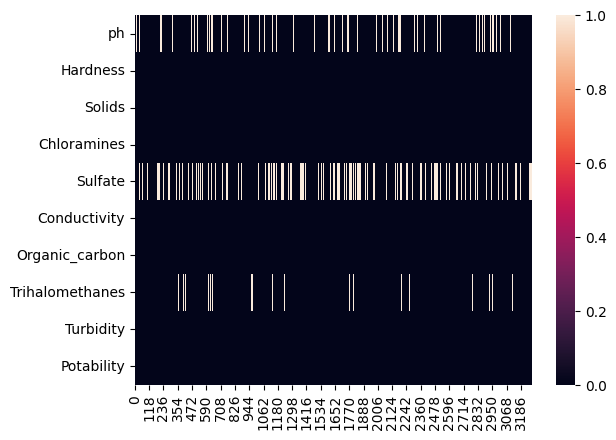

In [9]:
#missing data in percentage for each column
sns.heatmap(data.isna().transpose())
plt.show()

In [10]:
data.isna().sum()/len(data)*100

ph                 14.987790
Hardness            0.000000
Solids              0.000000
Chloramines         0.000000
Sulfate            23.840049
Conductivity        0.000000
Organic_carbon      0.000000
Trihalomethanes     4.945055
Turbidity           0.000000
Potability          0.000000
dtype: float64

## Data Preprocessing

In [11]:
#Imputing the rows in which glucose value is null by the mean value of glucose from that column.
data['ph'].fillna(data['ph'].mean(),inplace=True)

In [12]:
data['Sulfate'].fillna(data['Sulfate'].mean(),inplace=True)

In [13]:
data['Trihalomethanes'].fillna(data['Trihalomethanes'].mean(),inplace=True)

In [14]:
#Data has been cleaned and all the values have been imputed
data.isna().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [15]:
#Summary of the dataset after missing values
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               3276 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          3276 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3276 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [16]:
#Calculating statistical data
data.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.469956,32.879761,8768.570828,1.583085,36.142612,80.824064,3.308162,15.769881,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.277673,176.850538,15666.690297,6.127421,317.094638,365.734414,12.065801,56.647656,3.439711,0.000000
50%,7.080795,196.967627,20927.833607,7.130299,333.775777,421.884968,14.218338,66.396293,3.955028,0.000000
75%,7.870050,216.667456,27332.762127,8.114887,350.385756,481.792304,16.557652,76.666609,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


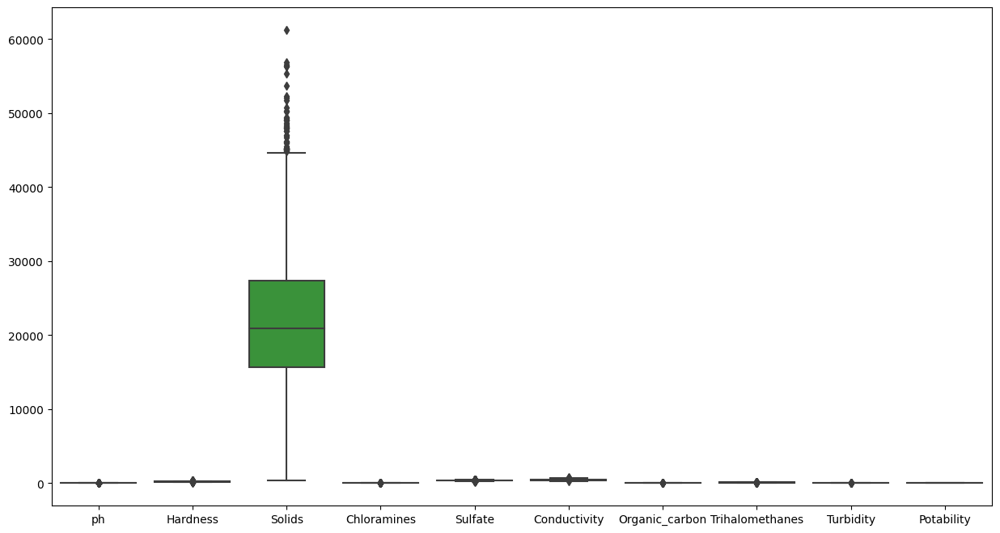

In [17]:
#Box plotting ro analyze outliers
plt.figure(figsize = (15, 8))
sns.boxplot(data = data)
plt.show()

We can observe outlilers as shown above in different columns.

In [18]:
#Removing outliers
for col in data.columns:
    if col not in ['Potability']:
        data = data[data[col] < data[col].quantile(0.99)]
        data = data[data[col] > data[col].quantile(0.01)]

In [19]:
# Changed statistical data after removing outliers
data.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2726.000000,2726.000000,2726.000000,2726.000000,2726.000000,2726.000000,2726.000000,2726.000000,2726.000000,2726.000000
mean,7.077072,196.211943,21798.144056,7.107582,334.012085,426.060527,14.321898,66.464177,3.967797,0.380044
std,1.306474,29.264404,7921.158856,1.423175,31.648141,76.494838,3.071271,14.636178,0.732690,0.485486
min,3.445062,114.807578,5576.628297,3.271144,240.936722,269.817539,6.658139,28.682952,2.148612,0.000000
25%,6.319667,177.844688,15767.503331,6.179407,318.073317,367.973153,12.182197,56.961417,3.445210,0.000000
50%,7.080795,196.812126,20919.651498,7.107117,333.775777,422.033283,14.246387,66.396293,3.948762,0.000000
75%,7.819313,215.262450,27006.249009,8.063256,349.913458,480.706504,16.531513,76.536371,4.496106,1.000000
max,10.811290,277.065713,45166.639389,10.896663,424.302122,617.540906,22.091990,104.747700,5.738991,1.000000


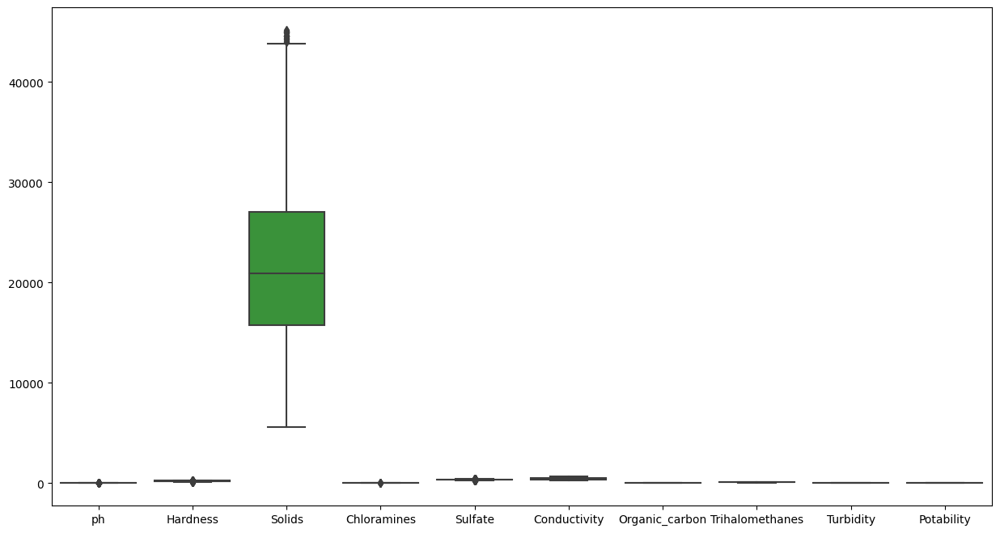

In [20]:
# Display in boxplot 
plt.figure(figsize = (15, 8))
sns.boxplot(data = data)
plt.show()

After analyzing the boxplot, it can be observed that the removal of the outliers has resulted.

In [21]:
#Statistical summary after removing outliers
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2726 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2726 non-null   float64
 1   Hardness         2726 non-null   float64
 2   Solids           2726 non-null   float64
 3   Chloramines      2726 non-null   float64
 4   Sulfate          2726 non-null   float64
 5   Conductivity     2726 non-null   float64
 6   Organic_carbon   2726 non-null   float64
 7   Trihalomethanes  2726 non-null   float64
 8   Turbidity        2726 non-null   float64
 9   Potability       2726 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 234.3 KB


From the above summary, we can observe that now the dataset contains 2726 non-null values for each column.  It is seen that the dataset is now clean and ready for analysis, with no missing values or outliers in any of the columns.

## Data Visualization

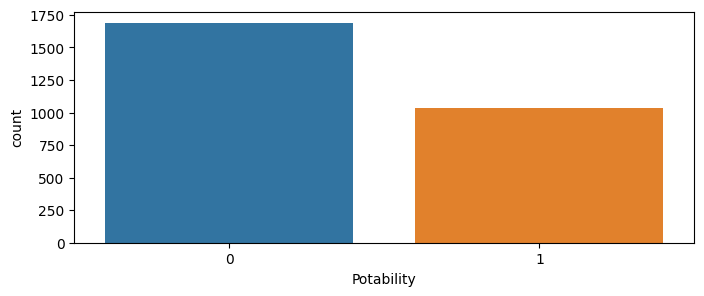

In [22]:
plt.figure(figsize = (8,3))
sns.countplot(x = 'Potability', data = data)
plt.show()

In [23]:
data['Potability'].value_counts()/len(data) *100

0    61.995598
1    38.004402
Name: Potability, dtype: float64

0 class has 61.99% and 1 class has 38% data. Clearly the given dataset is imbalanced.

In [24]:
fig = px.pie(names = data['Potability'].value_counts().index, values = data['Potability'].value_counts().values)
fig.update_layout(width = 600, height = 400)

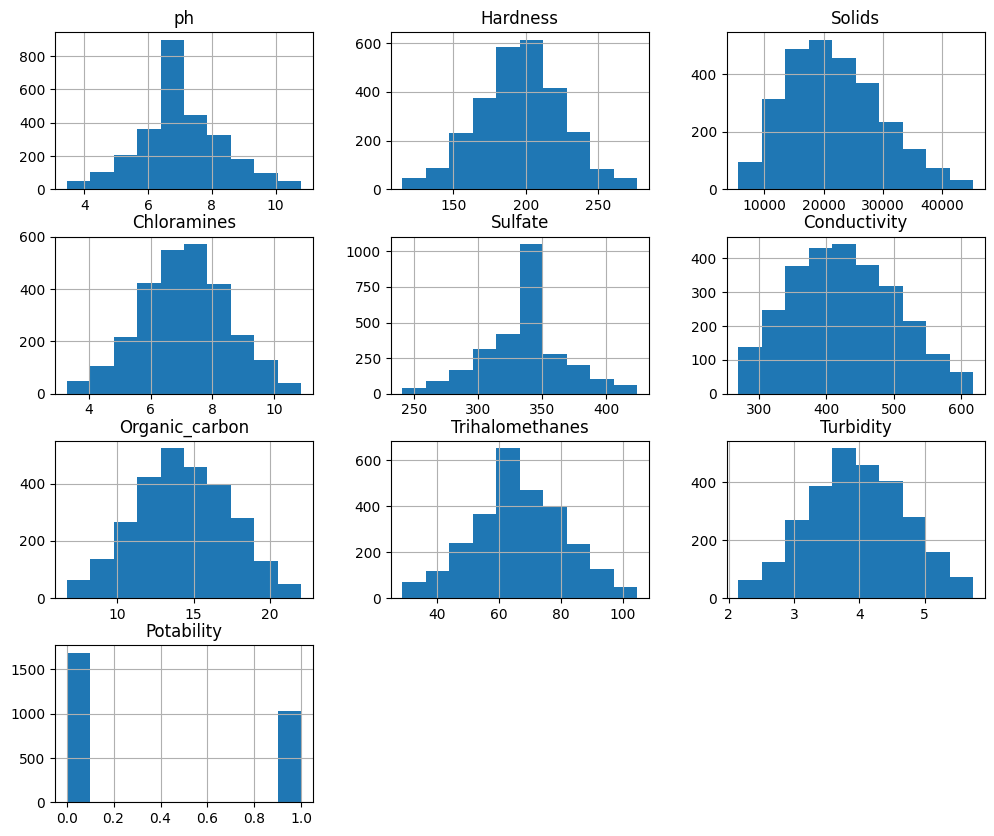

In [25]:
# Checking normality (how data is distributed) using histplot
data.hist(figsize = (12, 10), bins= 10)
plt.show()

Based on the histogram plot above, it is evident that all the input variables exhibit a normal distribution. There is no indication of any column being biased.

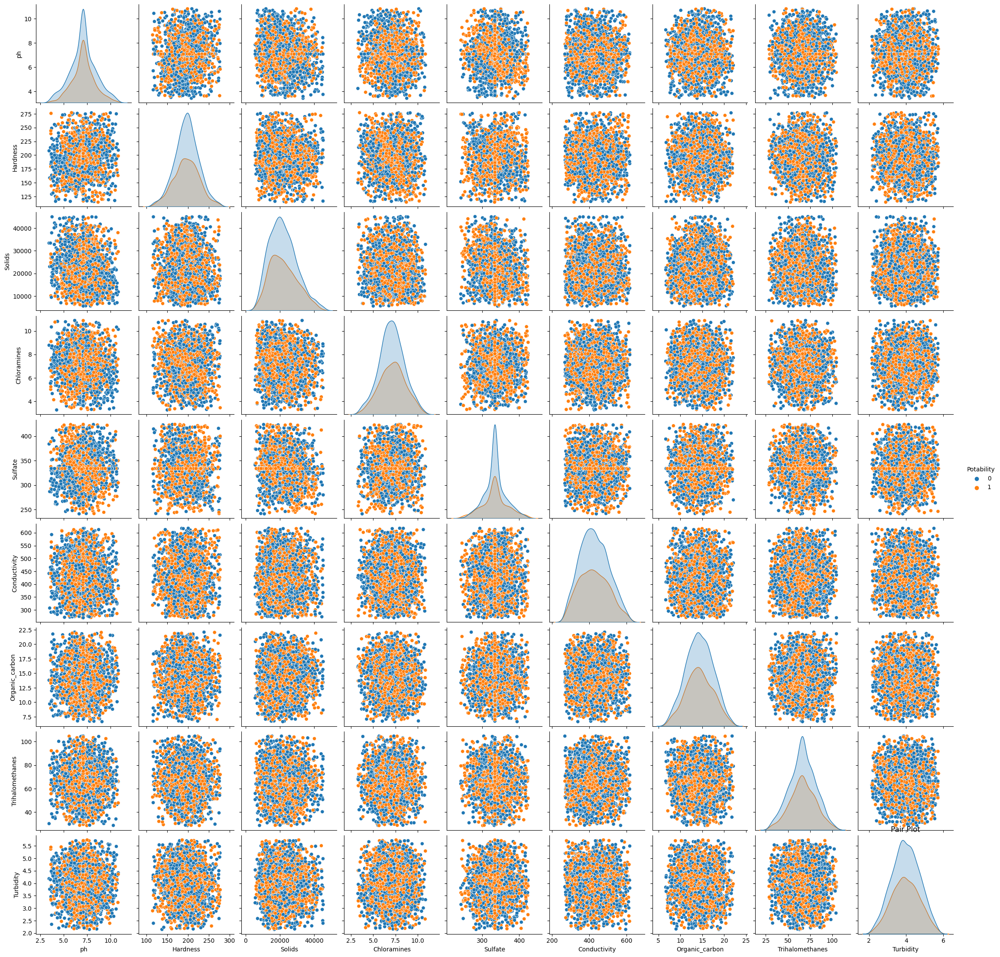

In [26]:
#Pairplot
sns.pairplot(data =data, hue='Potability')
plt.title('Pair Plot')
plt.show()

In [27]:
data.corr()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
ph,1.000000,0.116613,-0.078231,-0.060417,0.007928,0.005434,0.026756,0.008220,-0.033889,0.009615
Hardness,0.116613,1.000000,-0.047217,-0.016478,-0.052552,-0.020662,0.024849,-0.023269,-0.004706,-0.011771
Solids,-0.078231,-0.047217,1.000000,-0.044319,-0.122050,0.016762,0.028332,-0.022489,-0.000124,0.016391
Chloramines,-0.060417,-0.016478,-0.044319,1.000000,0.033590,-0.012285,-0.010608,0.010177,-0.011881,0.027960
Sulfate,0.007928,-0.052552,-0.122050,0.033590,1.000000,-0.011916,0.011910,-0.020386,-0.006342,-0.004701
Conductivity,0.005434,-0.020662,0.016762,-0.012285,-0.011916,1.000000,0.004882,0.000391,0.010198,-0.010677
Organic_carbon,0.026756,0.024849,0.028332,-0.010608,0.011910,0.004882,1.000000,-0.019438,-0.017156,-0.001515
Trihalomethanes,0.008220,-0.023269,-0.022489,0.010177,-0.020386,0.000391,-0.019438,1.000000,-0.020085,0.012730
Turbidity,-0.033889,-0.004706,-0.000124,-0.011881,-0.006342,0.010198,-0.017156,-0.020085,1.000000,-0.000976
Potability,0.009615,-0.011771,0.016391,0.027960,-0.004701,-0.010677,-0.001515,0.012730,-0.000976,1.000000


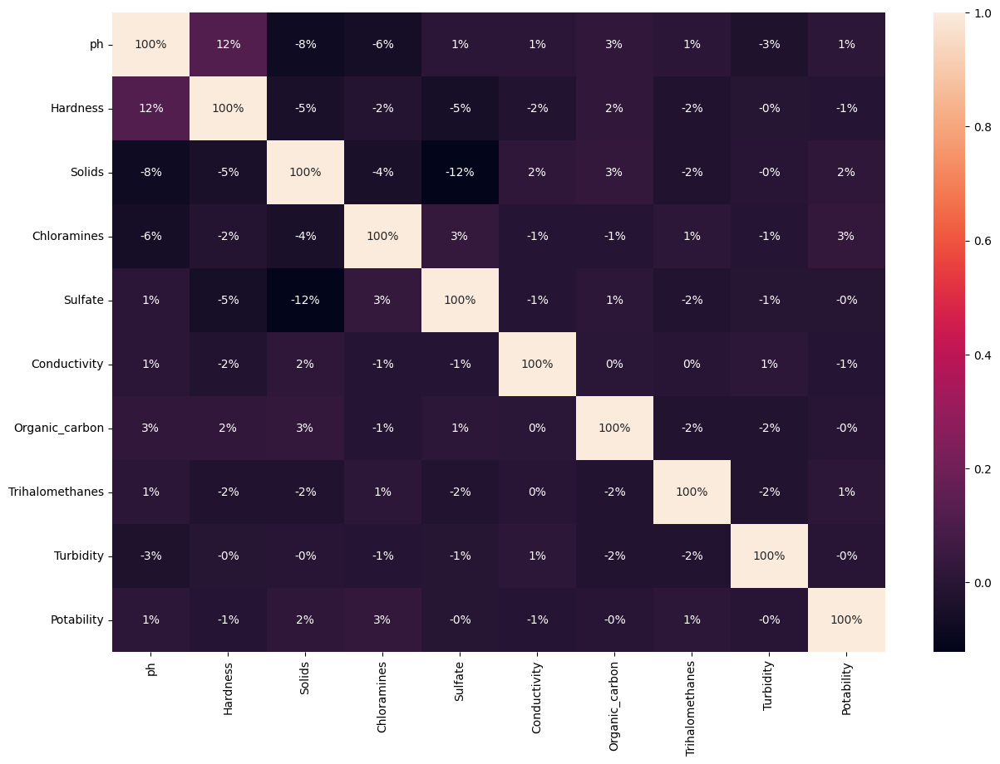

In [28]:
#Correlation heatmap
plt.figure(figsize =  (15, 10))
sns.heatmap(data = data.corr(), fmt = '.0%', annot = True)
plt.show()

Since columns 'Sulfate', 'Organic_carbon', 'Turbidity' have 0% correlation with Potability of water, it is safe to drop those columns

In [29]:
data = data.drop('Sulfate', axis = 1)

In [30]:
data = data.drop('Organic_carbon', axis = 1)

In [31]:
data = data.drop('Turbidity', axis = 1)

In [32]:
#Counts the no. of rows and columns after dropping columns
data.shape

(2726, 7)

In [33]:
# Displays the columns to list
data.columns.tolist()

['ph',
 'Hardness',
 'Solids',
 'Chloramines',
 'Conductivity',
 'Trihalomethanes',
 'Potability']

## Splitting data

In [34]:
#Separating the data into features(X) and target(y) and printing their shape

X = data.iloc[:, 0:6] #independent variable
y = data.iloc[:, 6]  #dependent variable

print(X.shape)
print(y.shape)

(2726, 6)
(2726,)


In [35]:
X.head()

,ph,Hardness,Solids,Chloramines,Conductivity,Trihalomethanes
0,7.080795,204.890455,20791.318981,7.300212,564.308654,86.990970
1,3.716080,129.422921,18630.057858,6.635246,592.885359,56.329076
2,8.099124,224.236259,19909.541732,9.275884,418.606213,66.420093
3,8.316766,214.373394,22018.417441,8.059332,363.266516,100.341674
4,9.092223,181.101509,17978.986339,6.546600,398.410813,31.997993


In [36]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: Potability, dtype: int64

In [37]:
y.tail()

3270    1
3272    1
3273    1
3274    1
3275    1
Name: Potability, dtype: int64

## Train-test Split

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state =40)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(2180, 6)
(546, 6)
(2180,)
(546,)


In [39]:
X_train

,ph,Hardness,Solids,Chloramines,Conductivity,Trihalomethanes
28,7.080795,266.421018,26362.965012,7.700063,364.480107,53.008381
1243,4.483403,172.383878,13122.223422,5.276731,413.545047,75.504542
2443,8.967244,266.478743,34446.782262,4.909573,343.265556,64.959670
181,6.511618,181.873422,29136.814624,7.685775,475.341351,52.437617
2333,7.080795,205.666016,27044.959810,4.033934,515.754936,48.029690
...,...,...,...,...,...,...
2215,7.989376,191.936191,16746.800392,8.562428,431.505677,77.928960
1598,7.080795,228.756819,32161.840090,6.961297,309.608411,54.268008
2644,5.655117,146.762023,19271.903123,6.391439,469.895002,62.004563
2453,7.080795,182.257814,17540.742498,8.422476,305.827535,61.696113


In [40]:
y_train

28      0
1243    0
2443    1
181     0
2333    1
       ..
2215    0
1598    1
2644    0
2453    1
2716    1
Name: Potability, Length: 2180, dtype: int64

## Trying two different models
- Logistic Regression
- SVM (Support Vector Machine)

In [41]:
#Logistic Regression

#Creating Logistic model and training it
log_model = LogisticRegression(max_iter=5000)  # without max_iter = ConvergenceWarning
log_model.fit(X_train, y_train)

#Making predictions on the test set
log_pred = log_model.predict(X_test)

In [42]:
# Confusion Matrix of Suppport Vector Machine

cm = confusion_matrix(y_true = y_test, y_pred = log_pred)
cm

array([[343,   0],
       [203,   0]], dtype=int64)

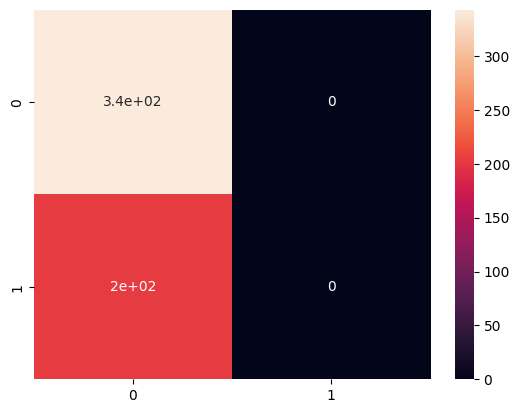

In [43]:
sns.heatmap(confusion_matrix(y_test, log_pred), annot=True)
plt.show()

In [44]:
print(classification_report(y_true = y_test, y_pred = log_pred))

              precision    recall  f1-score   support

           0       0.63      1.00      0.77       343
           1       0.00      0.00      0.00       203

    accuracy                           0.63       546
   macro avg       0.31      0.50      0.39       546
weighted avg       0.39      0.63      0.48       546



C:\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [45]:
#SVM

#Creating SVM model and training it
svm_model = SVC()  
svm_model.fit(X_train, y_train)

#Making prediciton in the test set
svm_pred = svm_model.predict(X_test)

In [46]:
# Confusion Matrix of Suppport Vector Machine

cm = confusion_matrix(y_true = y_test, y_pred = svm_pred)
cm

array([[343,   0],
       [203,   0]], dtype=int64)

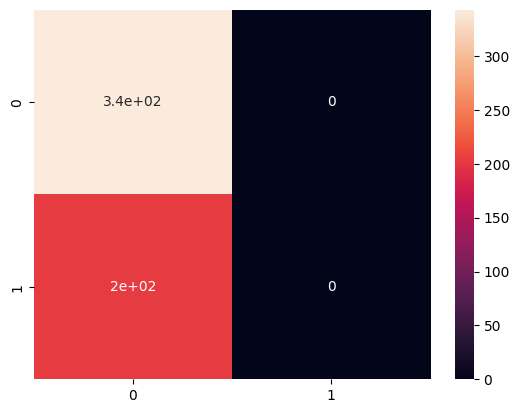

In [47]:
sns.heatmap(confusion_matrix(y_test, svm_pred), annot=True)
plt.show()

In [48]:
print(classification_report(y_true = y_test, y_pred = svm_pred))

              precision    recall  f1-score   support

           0       0.63      1.00      0.77       343
           1       0.00      0.00      0.00       203

    accuracy                           0.63       546
   macro avg       0.31      0.50      0.39       546
weighted avg       0.39      0.63      0.48       546



C:\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



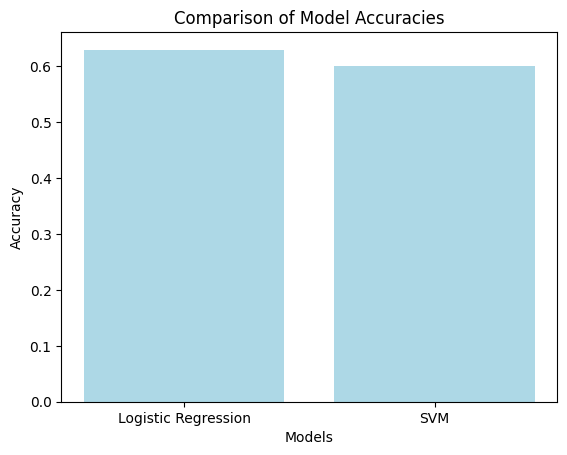

In [49]:
model_compare = ['Logistic Regression', 'SVM']
accuracies = [0.63, 0.60]

plt.bar(model_compare, accuracies, color='lightblue')

plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Comparison of Model Accuracies')
plt.show()